## Stable Diffusion (built-in pipeline and custom pipeline)

"Diffusers is the go-to library for state-of-the-art pretrained diffusion models for generating images, audio, and even 3D structures of molecules. Whether you're looking for a simple inference solution or training your own diffusion models, 🤗 Diffusers is a modular toolbox that supports both. Our library is designed with a focus on usability over performance, simple over easy, and customizability over abstractions."

(Diffusers Library Info)

### Dependencies

In [ ]:
# !pip install -Uq diffusers transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.9/934.9 kB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 64.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 87.7 MB/s eta 0:00:00


In [ ]:
import torch
import logging
import matplotlib.pyplot as plt

from PIL import Image
from pathlib import Path
from fastcore.all import concat
from huggingface_hub import notebook_login
from diffusers import StableDiffusionPipeline

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

### Stable Diffusion Pipeline 

Is an end-to-end diffusion inference pipeline that allows you to start generating images with just a few lines of code. Many Hugging Face libraries (along with other libraries such as scikit-learn) use the concept of a "pipeline" to indicate a sequence of steps that when combined complete some task.

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

In [ ]:
!ls ~/.cache/huggingface/hub

models--CompVis--stable-diffusion-v1-4	version.txt
version_diffusers_cache.txt


In [ ]:
prompt = "a photograph of a mecha robot in the desert"

  0%|          | 0/50 [00:00<?, ?it/s]

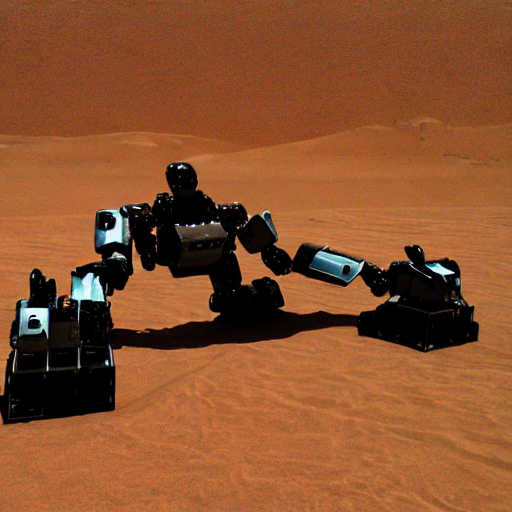

In [ ]:
pipe(prompt).images[0]

The pipeline shows a progress bar with a certain number of steps, this is because Stable Diffusion is based on a progressive denoising algorithm that is able to create a convincing image starting from pure random noise.

  0%|          | 0/50 [00:00<?, ?it/s]

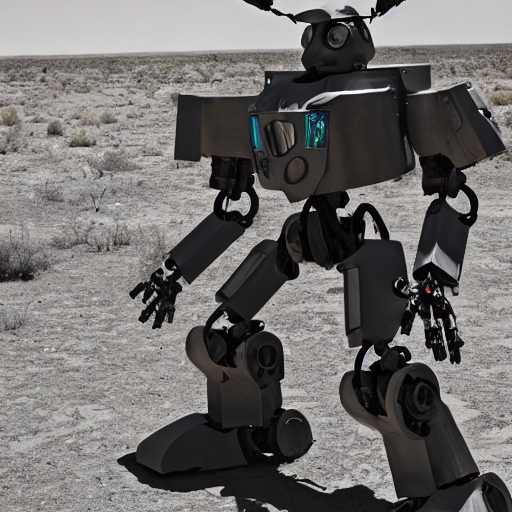

In [ ]:
torch.manual_seed(1024)
pipe(prompt).images[0]

Example with a few steps:

  0%|          | 0/3 [00:00<?, ?it/s]

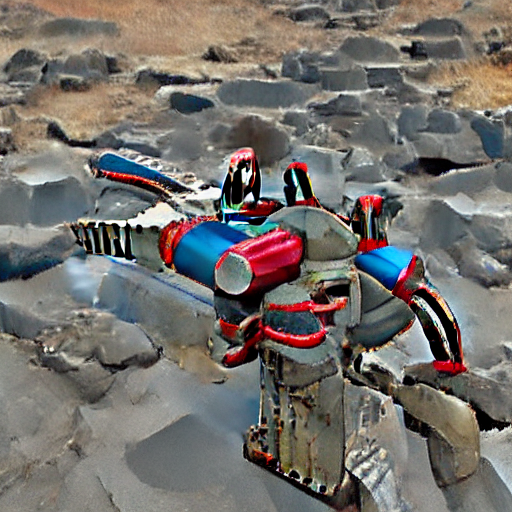

In [ ]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=3).images[0]

Example with more steps:

  0%|          | 0/16 [00:00<?, ?it/s]

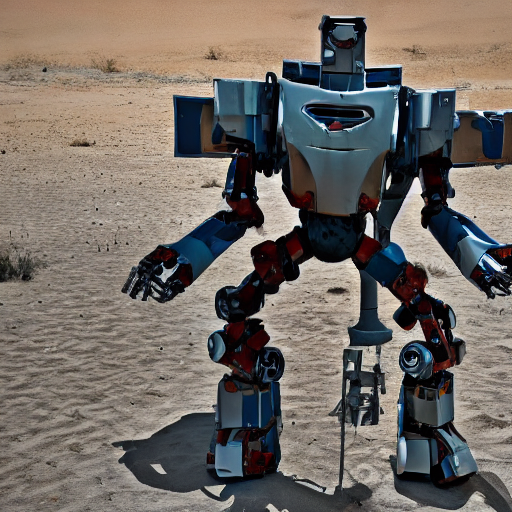

In [ ]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=16).images[0]

### Classifier-free diffusion guidance

Is a method to increase the adherence of the output to the conditioning signal we used (the text), dramatically improves samples produced by conditional diffusion models at almost no cost. It is simple to implement and extremely effective.

It possible to generate multiple images for the same prompt by simply passing a list of prompts instead of a string.

In [ ]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [ ]:
num_rows,num_cols = 3,3
prompts = [prompt] * num_cols

In [ ]:
images = concat(pipe(prompts, guidance_scale=g).images for g in [1.1,3,7,14])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

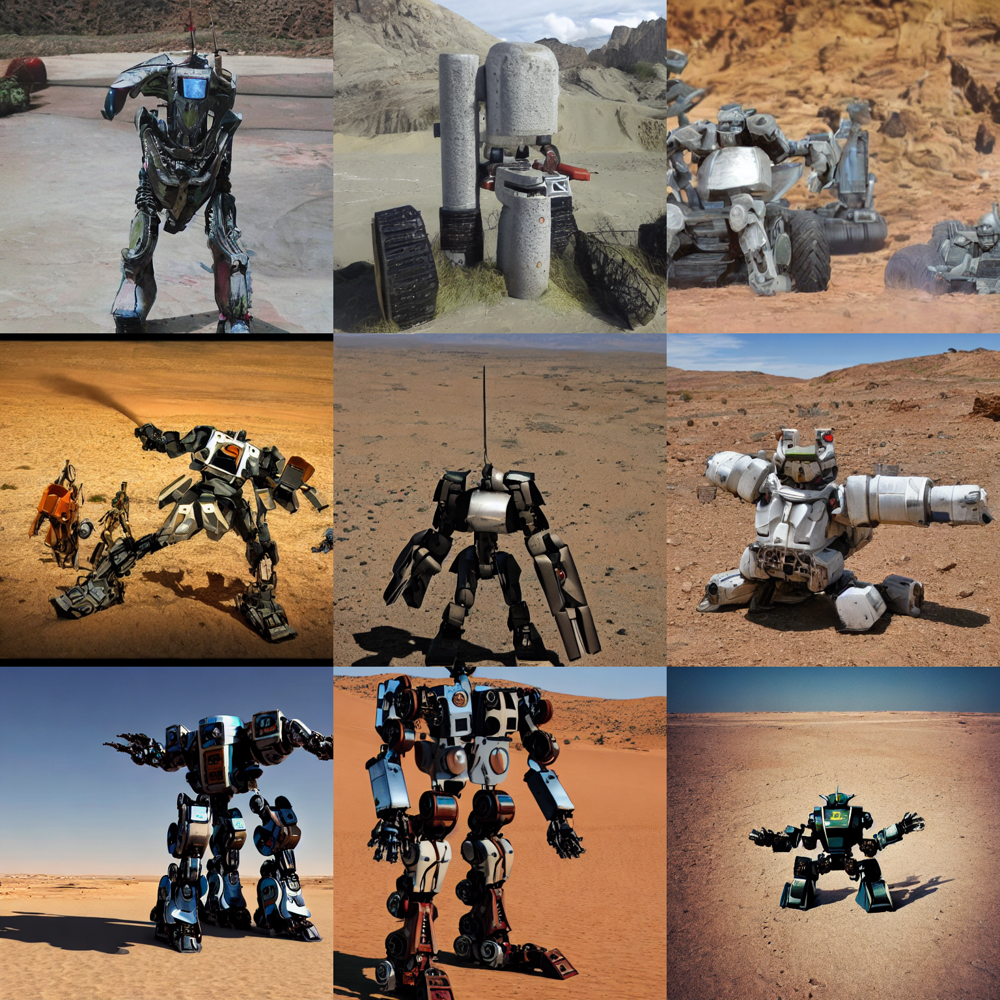

In [ ]:
image_grid(images, rows=num_rows, cols=num_cols)

### Negative prompts

The negative prompt is a parameter that tells Stable Diffusion what you don't want to see in the generated images. When specified, it guides the generation process not to include things in the image according to a given text.

A negative prompt may prevent generating specific things, styles or fix some image abnormalities.

  0%|          | 0/50 [00:00<?, ?it/s]

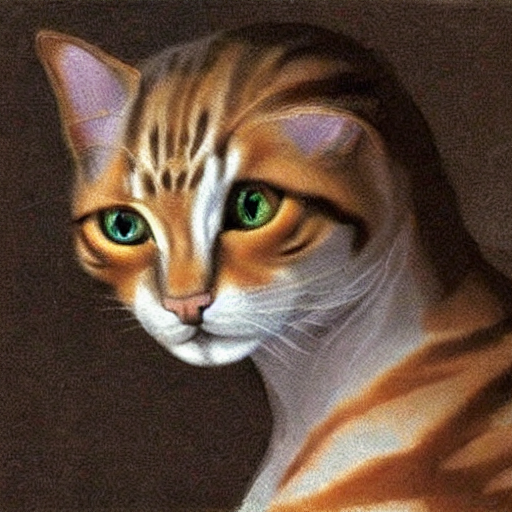

In [ ]:
torch.manual_seed(1000)
prompt = "Michelangelo style cat"
pipe(prompt).images[0]

By using the negative prompt, reduce the importance of the negative prompt in our composition.

  0%|          | 0/50 [00:00<?, ?it/s]

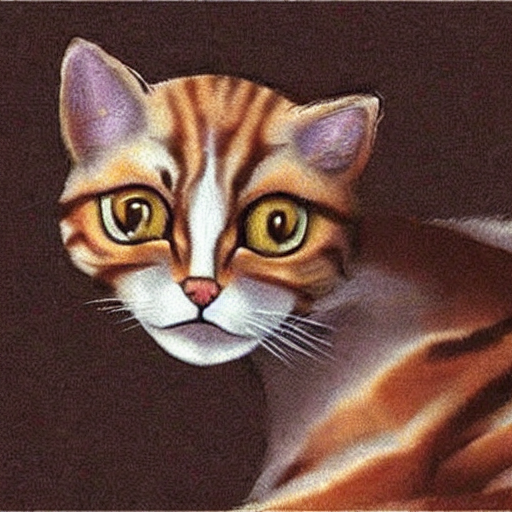

In [ ]:
torch.manual_seed(1000)
pipe(prompt, negative_prompt="green").images[0]

### Image to Image

Is an approach to img2img generation that uses a deep generative model to synthesize images based on a given prompt and image. Instead of starting from pure noise, we can start from an image an add a certain amount of noise to it.

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

In [ ]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="fp16",
    torch_dtype=torch.float16,
).to("cuda")

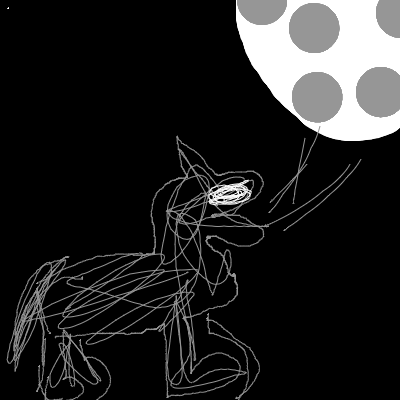

In [ ]:
p = FastDownload().download('https://s3.amazonaws.com/moonup/production/uploads/1664665907257-noauth.png')
init_image = Image.open(p).convert("RGB")
init_image

/usr/local/lib/python3.10/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:559: FutureWarning: You have passed 3 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/40 [00:00<?, ?it/s]

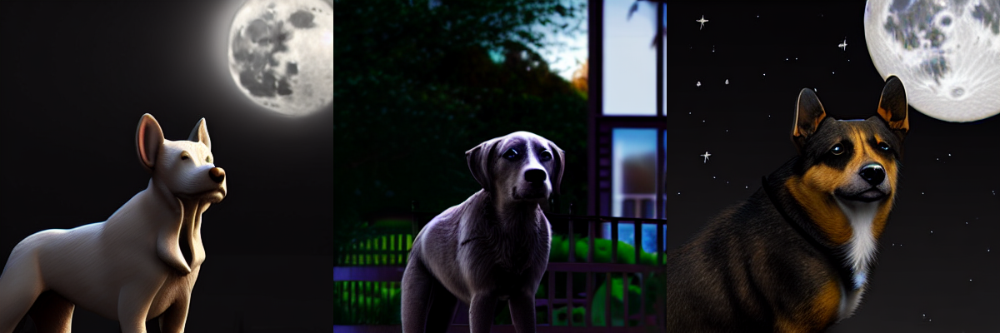

In [ ]:
torch.manual_seed(1000)
prompt = "Sad dog watching the full moon, photorealistic 4K"
images = pipe(prompt=prompt, num_images_per_prompt=3, image=init_image, strength=0.8, num_inference_steps=50).images
image_grid(images, rows=1, cols=3)

When we get a composition we like we can use it as the next seed for another prompt and further change the results.

In [ ]:
init_image = images[2]

  0%|          | 0/70 [00:00<?, ?it/s]

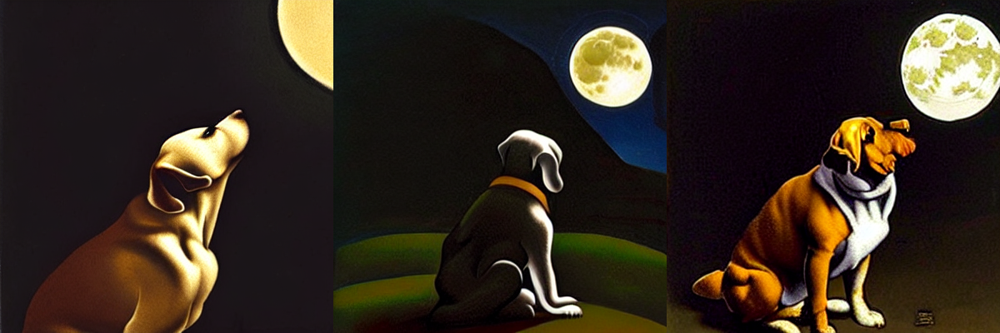

In [ ]:
torch.manual_seed(1000)
prompt = "Oil painting of sad dog watching the full moon by Michelangelo"
images = pipe(prompt=prompt, num_images_per_prompt=3, image=init_image, strength=1, num_inference_steps=70).images
image_grid(images, rows=1, cols=3)

### Textual Inversion

Textual inversion involves training the Stable Diffusion model to better recreate a set of image's distinct features when generating from the same model by functionally creating a brand new word token for the model to ascribe these features to. Primarily then, we need to source data that represents the concept we want to embody.

Using embeddings trained for this style:
`https://huggingface.co/sd-concepts-library/indian-watercolor-portraits`

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16) 
pipe = pipe.to("cuda")

In [ ]:
embeds_url = "https://huggingface.co/sd-concepts-library/indian-watercolor-portraits/resolve/main/learned_embeds.bin"
embeds_path = FastDownload().download(embeds_url)
embeds_dict = torch.load(str(embeds_path), map_location="cpu")

The embeddings for the new token are stored in a small PyTorch pickled dictionary, whose key is the new text token that was trained. Since the encoder of our pipeline does not know about this term, we need to manually append it.

In [ ]:
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder
new_token, embeds = next(iter(embeds_dict.items()))
embeds = embeds.to(text_encoder.dtype)
new_token

'<watercolor-portrait>'

We add the new token to the tokenizer and the trained embeddings to the embeddings table.

In [ ]:
assert tokenizer.add_tokens(new_token) == 1, "The token already exists!"

In [ ]:
text_encoder.resize_token_embeddings(len(tokenizer))
new_token_id = tokenizer.convert_tokens_to_ids(new_token)
text_encoder.get_input_embeddings().weight.data[new_token_id] = embeds

We can now run inference and refer to the style as if it was another word in the dictionary.

  0%|          | 0/50 [00:00<?, ?it/s]

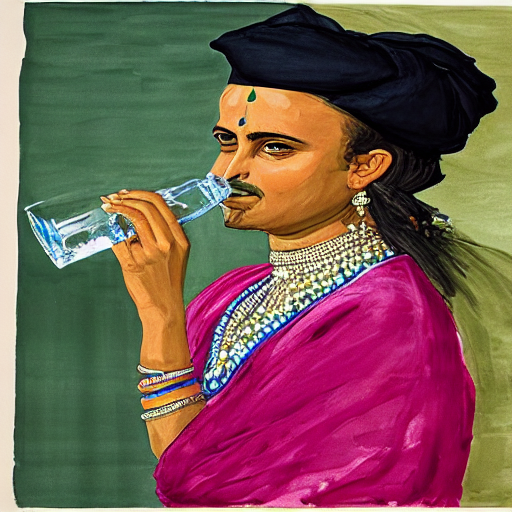

In [ ]:
torch.manual_seed(1000)
image = pipe("Woman drinking water in the style of <watercolor-portrait>").images[0]
image